

 **Mixture of Gaussians** model. 




In [1]:
import os
import numpy as np
import scipy
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from IPython import display
%matplotlib inline

In [2]:
from google.colab import files
files.upload()
data_npy_file = 'PB_data.npy'

# Loading data from .npy file
data = np.load(data_npy_file, allow_pickle=True)

ModuleNotFoundError: No module named 'google.colab'

In [4]:
data

array({'f3': array([2850, 2790, 2640, ..., 3380, 2160, 2200], dtype=uint16), 'f2': array([2280, 2400, 2030, ..., 1140, 1850, 1830], dtype=uint16), 'f1': array([240, 280, 390, ..., 500, 740, 660], dtype=uint16), 'f0': array([160, 186, 203, ..., 334, 308, 328], dtype=uint16), 'phoneme_id': array([ 1,  1,  2, ...,  9, 10, 10], dtype=uint8)},
      dtype=object)

In [5]:
data = np.ndarray.tolist(data)
# Array that contains the phoneme ID (1-10) of each sample
phoneme_id = data['phoneme_id']

# frequencies f1 and f2
f1 = data['f1']
f2 = data['f2']

<function matplotlib.pyplot.show(*args, **kw)>

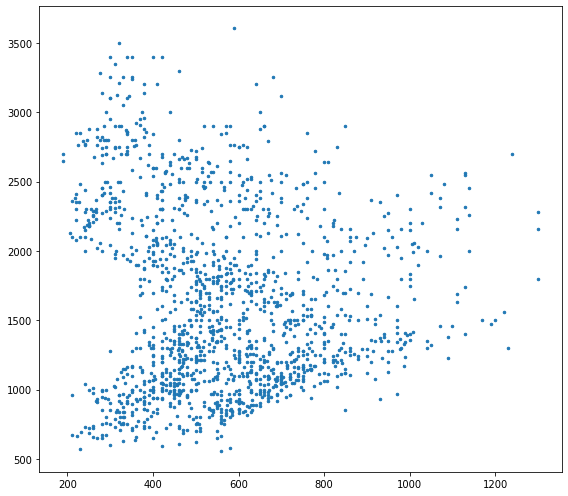

In [8]:
### your code here
plt.rcParams['figure.figsize'] = [8, 7]
plt.rcParams['figure.autolayout'] = True
plt.plot(f1,f2, linestyle='none', marker='.', markersize=5)
plt.show 

<function matplotlib.pyplot.show(*args, **kw)>

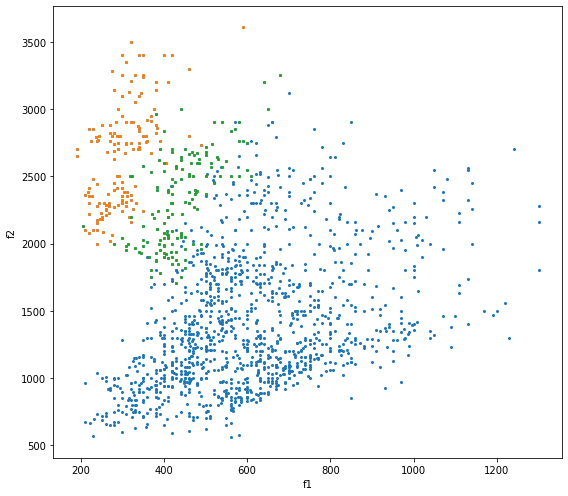

In [81]:
plt.plot(f1,f2,linestyle="none",marker='.',markersize="4")
plt.xlabel("f1")
plt.ylabel("f2")
plt.show

f1_pid_1 = f1[phoneme_id==1]
f2_pid_1 = f2[phoneme_id==1]
plt.plot(f1_pid_1,f2_pid_1,linestyle="none",marker='.',markersize="4")
plt.xlabel("f1")
plt.ylabel("f2")
plt.show

f1_pid_2 = f1[phoneme_id==2]
f2_pid_2 = f2[phoneme_id==2]
plt.plot(f1_pid_2,f2_pid_2,linestyle="none",marker='.',markersize="4")
plt.xlabel("f1")
plt.ylabel("f2")
plt.show 

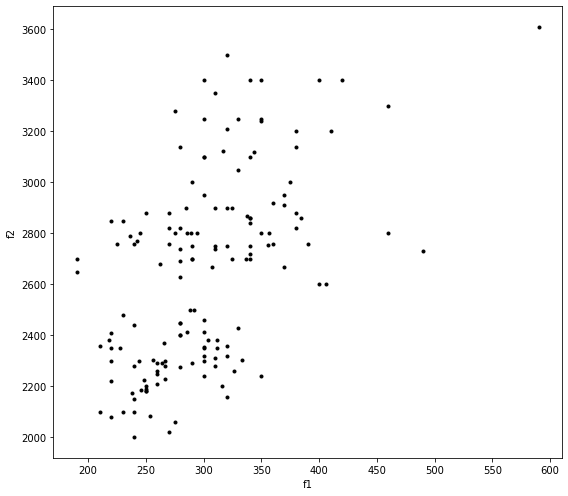

In [80]:
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

ig, ax = plt.subplots()
ax.set_xlabel('f1')
ax.set_ylabel('f2')
ax.scatter(X[:,0], X[:,1], c='black', marker='.', label=title_string)
plt.show()

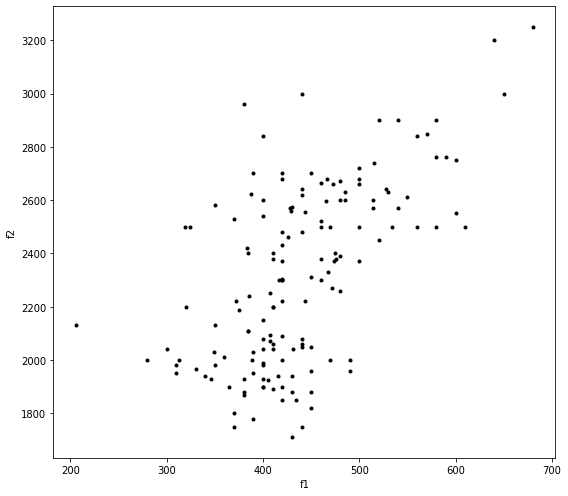

In [76]:
p_id = 2
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

fig, ax = plt.subplots()
ax.set_xlabel('f1')
ax.set_ylabel('f2')
ax.scatter(X[:,0], X[:,1], c='black', marker='.', label=title_string)
plt.show()

In [9]:
def get_predictions(mu, s, p, X):
	"""
		:param mu			: means of GMM components
		:param s			: covariances of GMM components
		:param p 			: weights of GMM components
		:param X			: 2D array of our dataset
	"""

	# get number of GMM components
	k = s.shape[0]
	# get number of data samples
	N = X.shape[0]
	# get dimensionality of our dataset
	D = X.shape[1]

	Z = np.zeros((N, k))
	for i in range(k):
		mu_i = mu[i, :]
		mu_i = np.expand_dims(mu_i, axis=1)
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		X_minus_mu = X - mu_i_repeated.transpose()
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		s_i_det = scipy.linalg.det(s[i])
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
		Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))
	return Z


In [50]:
def plot_gaussians(ax, s, mu, X, title_string):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    ax.clear()
    if X.shape[1] == 2:
        # set label of horizontal axis
        ax.set_xlabel('f1')
        # set label of vertical axis
        ax.set_ylabel('f2')
        # scatter the points, with red color
        ax.scatter(X[:,0], X[:,1], c='black', marker='.', label=title_string)

    k = s.shape[0]
    color_list = ['r', 'g', 'b', 'c', 'm', 'y']
    N_sides = 11

    # Iterate over all gaussians
    for k_cnt in range(k):
        
        # pick the covariance matrix and mean values of each gaussian
        s_k = s[k_cnt]
        mu_k = mu[k_cnt]

        if s_k.shape[0]==2:
            # dataset with 2 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*2*np.pi
            matrix = np.array([np.cos(theta), np.sin(theta)])
            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), matrix) + mu_repeated
            plt.plot(epoints[0,:], epoints[1,:], color=color_list[k_cnt], linewidth=2)
            plt.scatter(mu_k[0], mu_k[1], color=color_list[k_cnt], marker='o', linewidth=2)
        elif s_k.shape[0]==3:
            # dataset with 3 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*np.pi
            phi = side_range/(N_sides-1)*2*np.pi
            sin_theta = np.expand_dims(np.sin(theta), axis=1)
            cos_theta = np.expand_dims(np.cos(theta), axis=1)
            sin_phi = np.expand_dims(np.sin(phi), axis=1)
            cos_phi = np.expand_dims(np.cos(phi), axis=1)
            sx = np.matmul(sin_theta, cos_phi.transpose())
            sy = np.matmul(sin_theta, sin_phi.transpose())
            sz = np.matmul(cos_theta, np.ones((1, N_sides)))
            svect = np.array([sx.reshape((N_sides*N_sides)), sy.reshape((N_sides*N_sides)), sz.reshape((N_sides*N_sides))])

            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides*N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), svect) + mu_repeated

            ex = epoints[0]
            ey = epoints[1]
            ez = epoints[2]
            
            ax.plot3D(epoints[0,:], epoints[1,:], epoints[2,:], color=color_list[k_cnt])
            ax.plot3D(ex, ey, ez, color=color_list[k_cnt])
        else:
            print('Each dataset sample should have either 2 or 3 features. Not plotting this one.')
    ax.legend()
    display.clear_output(wait=True)
    display.display(plt.gcf())

def plot_data_3D(X, title_string, ax):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    # clear subplot from previous (if any) drawn stuff
    ax.clear()
    # set label of x axis
    ax.set_xlabel('f1')
    # set label of y axis
    ax.set_ylabel('f2')
    # set label of z axis
    ax.set_zlabel('f1 + f2')
    # scatter the points, with red color
    ax.scatter3D(X[:,0], X[:,1], X[:,2], c='black', marker='o', label=title_string)
    # add legend to the subplot
    ax.legend()


def save_model(mu, s, p):
  GMM_parameters = {}
  GMM_parameters['mu'] = mu
  GMM_parameters['s'] = s
  GMM_parameters['p'] = p
  if not os.path.isdir('data/'):
    os.mkdir('data/')
  npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
  np.save(npy_filename, GMM_parameters)

In [11]:
k = 3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

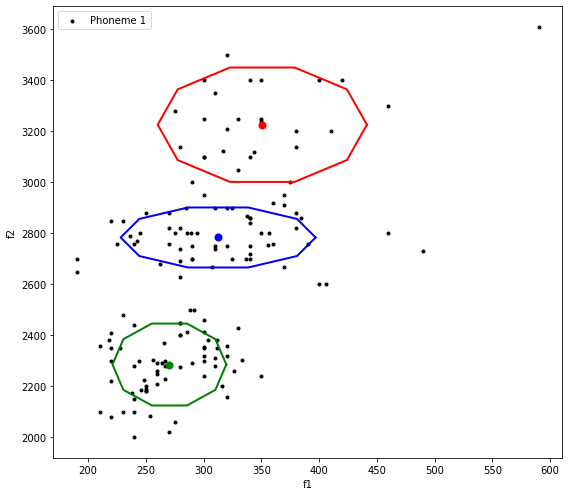


Finished.


Means of GMM components.

[[ 350.8446  3226.3394 ]
 [ 270.3952  2285.4653 ]
 [ 312.59125 2783.898  ]]



Covariances of GMM components.

[[[ 4102.87537478     0.        ]
  [    0.         27829.54222673]]

 [[ 1213.73843494     0.        ]
  [    0.         14278.42029969]]

 [[ 3562.59743767     0.        ]
  [    0.          7657.84897123]]]


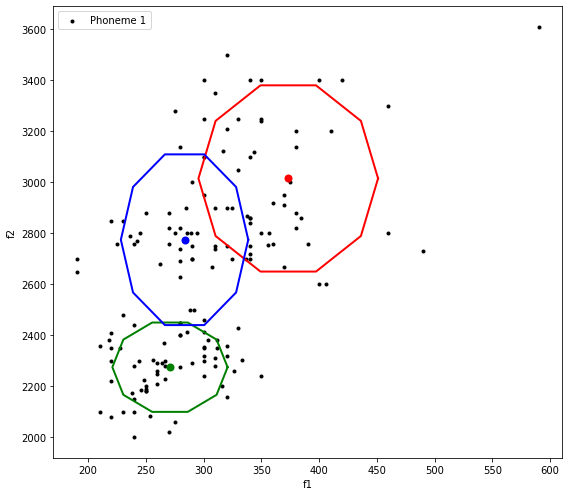

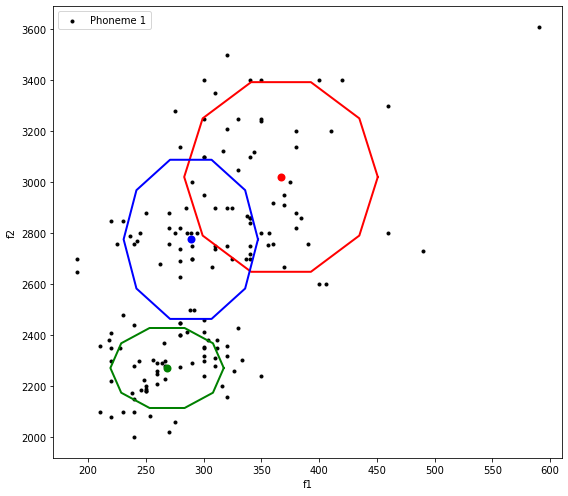

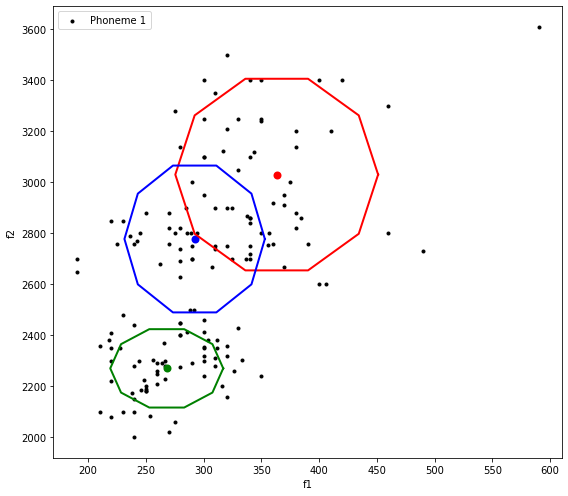

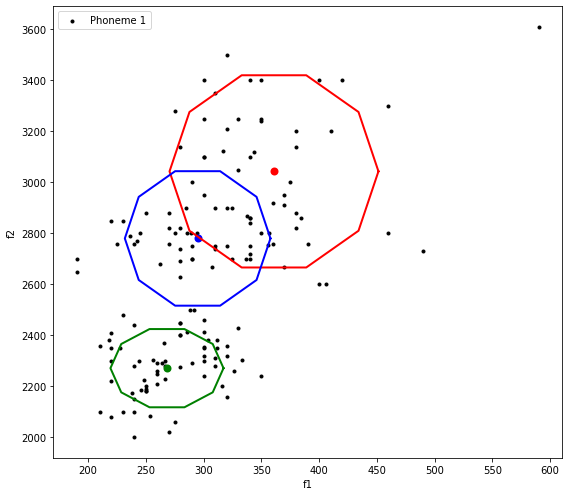

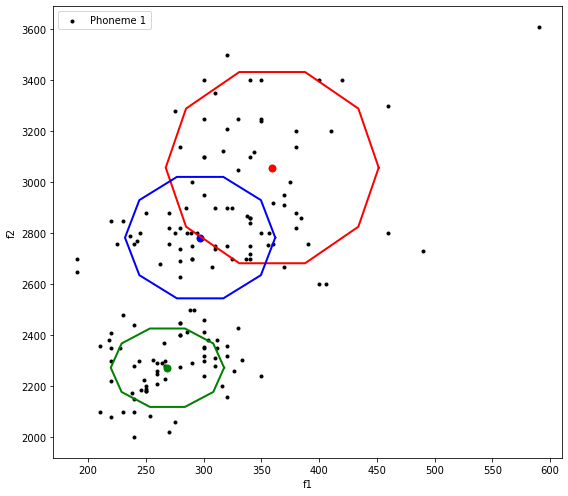

...

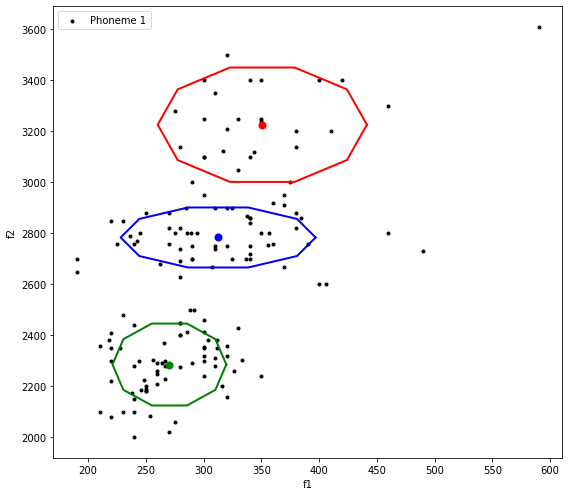

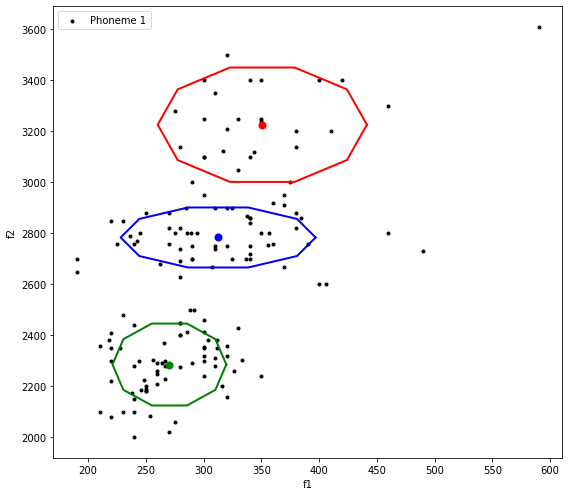

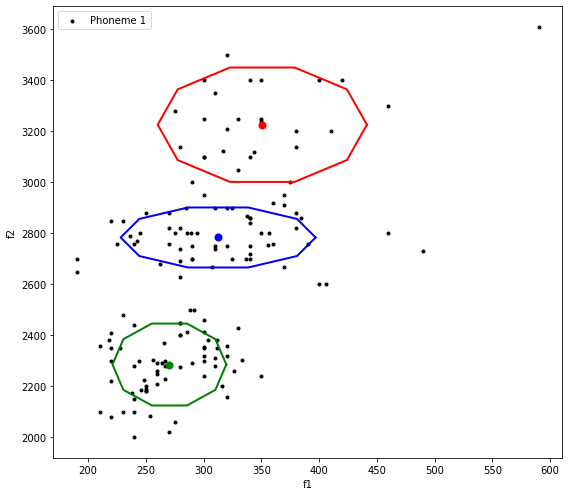

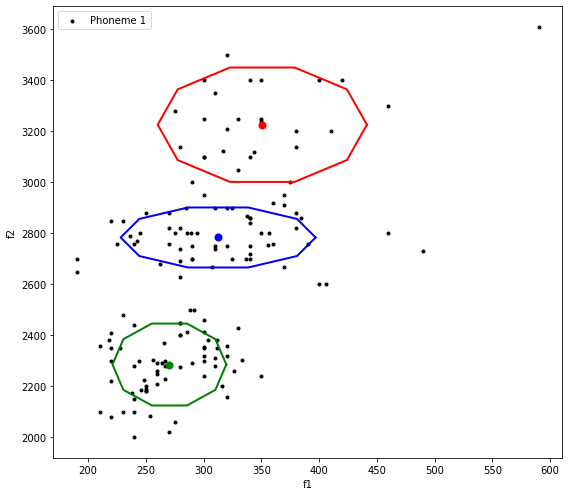

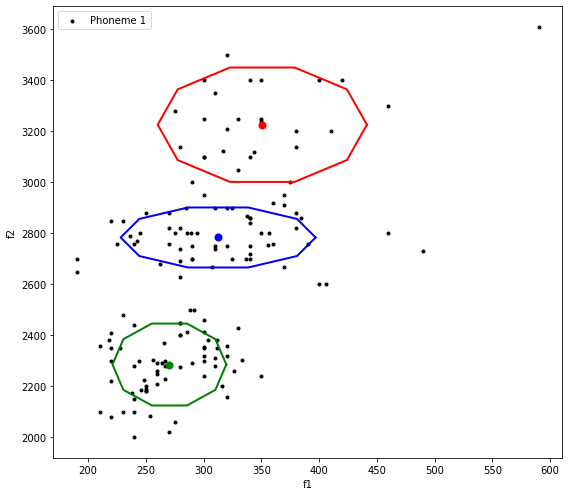

In [14]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)
        
        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print('\nMeans of GMM components.\n')
print(mu)
print('\n')
print('\nCovariances of GMM components.\n')
print(s)
save_model(mu, s, p)

In [16]:
k = 3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 2
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

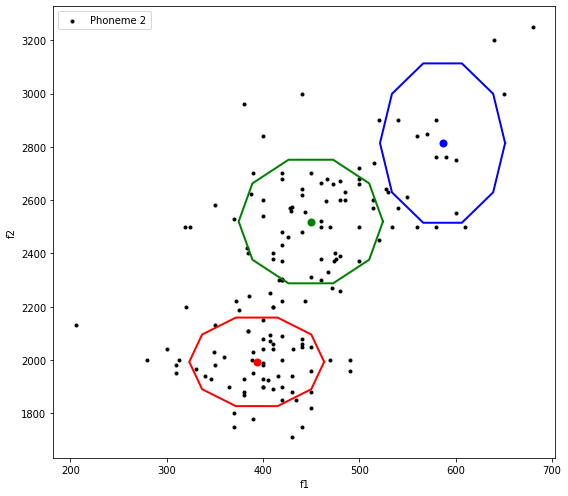


Finished.


Means of GMM components.

[[ 393.45172 1993.0709 ]
 [ 449.66412 2519.658  ]
 [ 586.539   2814.0872 ]]



Covariances of GMM components.

[[[ 2454.96989693     0.        ]
  [    0.         15261.46348137]]

 [[ 2808.48953309     0.        ]
  [    0.         29723.01109783]]

 [[ 2112.23507077     0.        ]
  [    0.         49424.47500069]]]


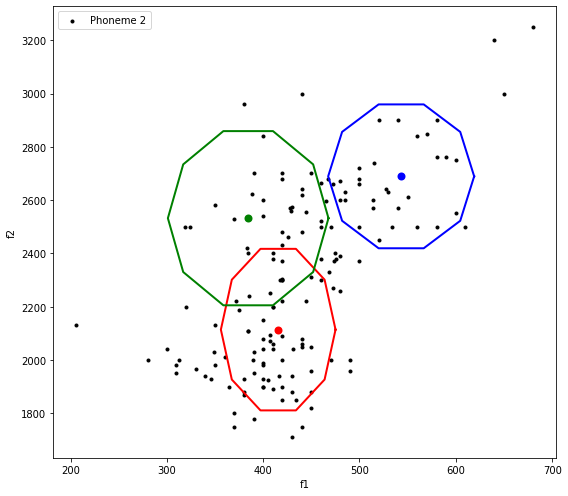

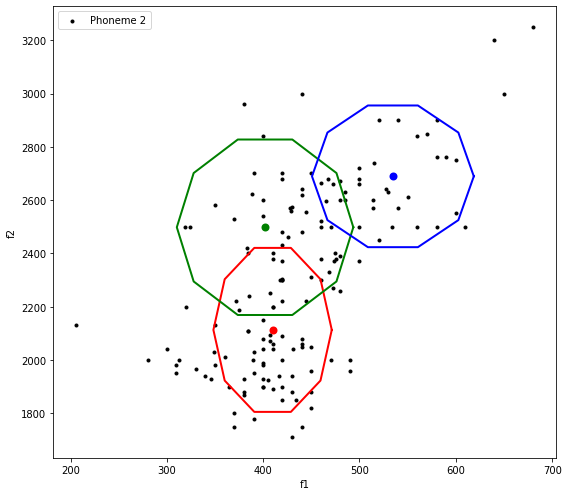

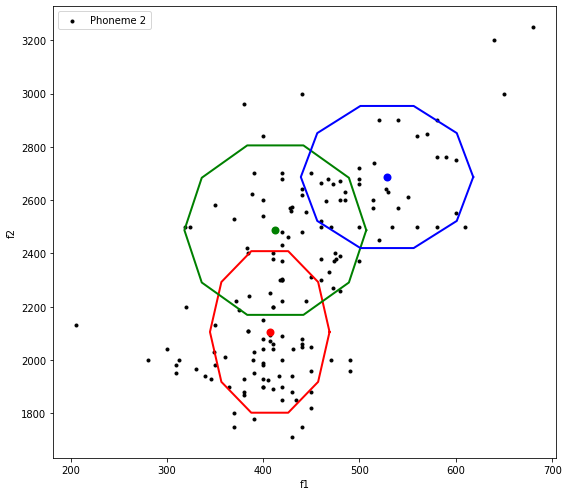

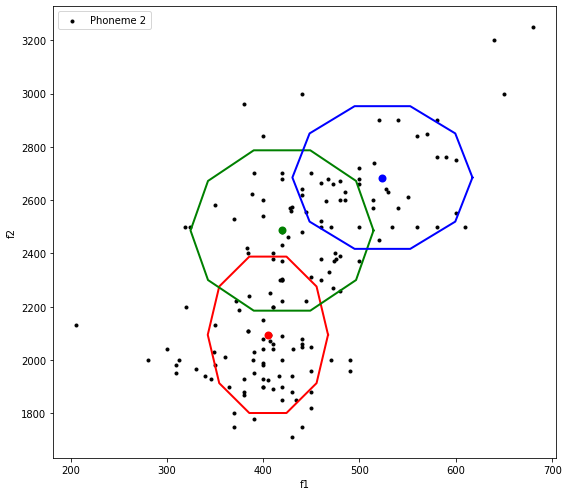

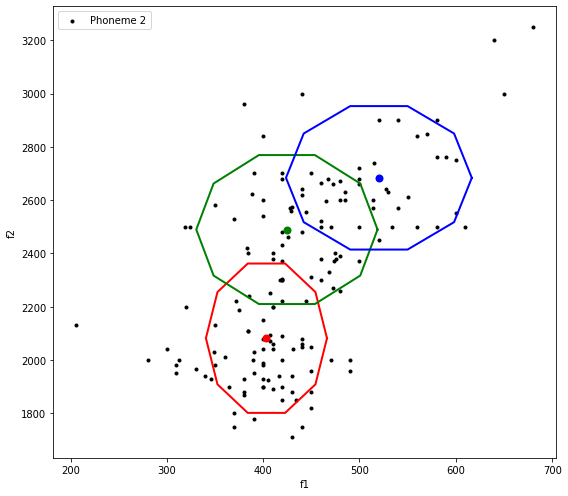

...

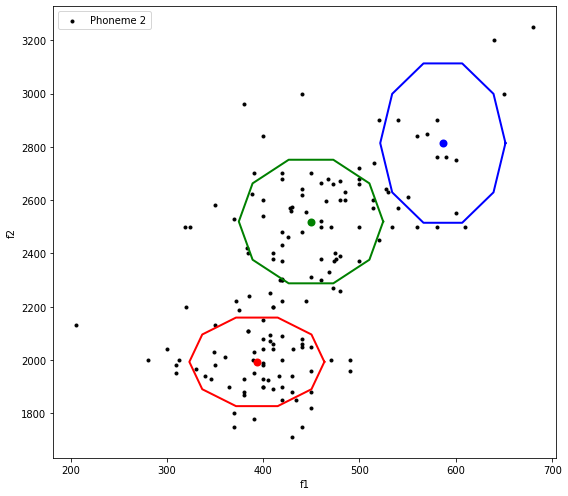

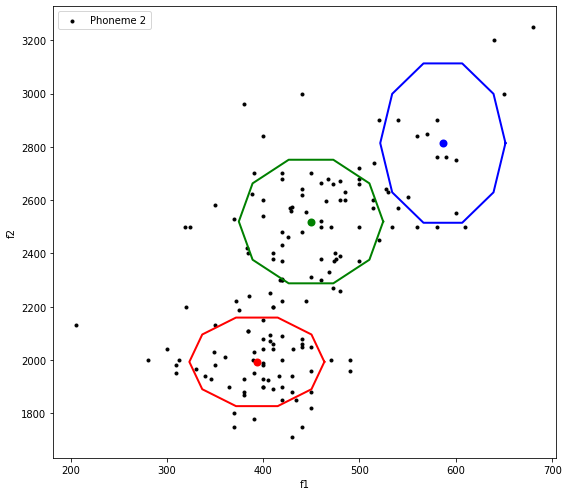

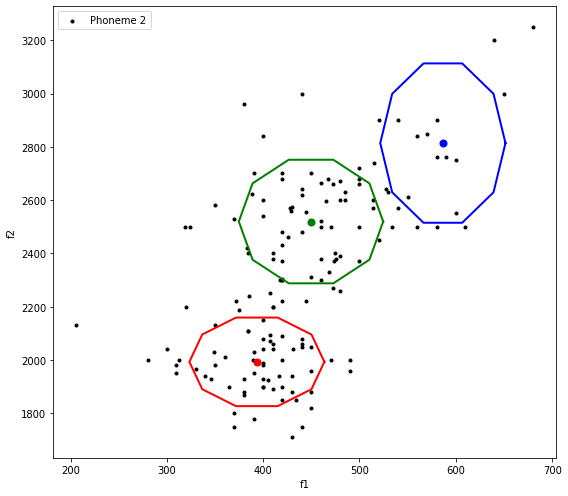

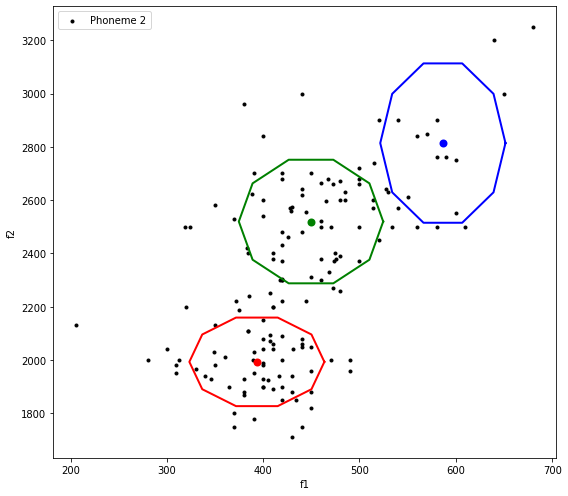

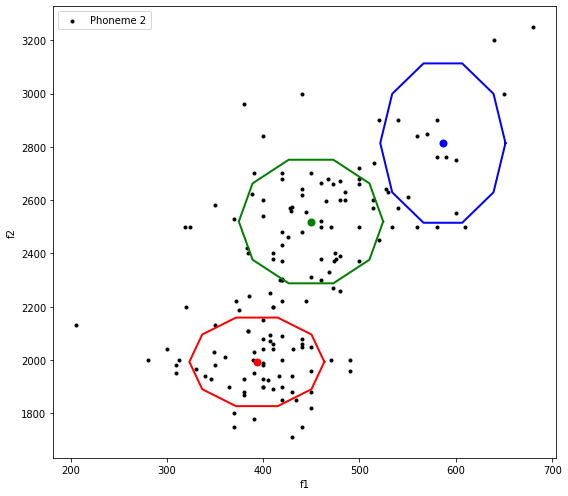

In [21]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)
        
        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print('\nMeans of GMM components.\n')
print(mu)
print('\n')
print('\nCovariances of GMM components.\n')
print(s)
save_model(mu, s, p)

In [22]:
print('\nMeans of GMM components.\n')
print(mu)
print('\n')
print('\nCovariances of GMM components.\n')
print(s)print('\nMeans of GMM components.\n')
print(mu)
print('\n')
print('\nCovariances of GMM components.\n')
print(s)k = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

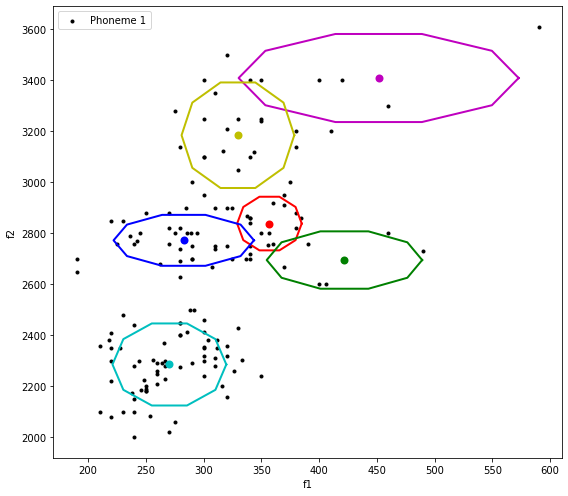


Finished.


Means of GMM components.

[[ 357.01    2838.531  ]
 [ 421.95932 2695.3816 ]
 [ 282.84363 2772.6926 ]
 [ 270.39264 2285.6677 ]
 [ 451.57422 3409.5237 ]
 [ 329.7233  3185.0852 ]]



Covariances of GMM components.

[[[  391.16780592     0.        ]
  [    0.          6117.92212608]]

 [[ 2265.12480327     0.        ]
  [    0.          7002.1894926 ]]

 [[ 1848.13554758     0.        ]
  [    0.          5515.81246402]]

 [[ 1214.16977506     0.        ]
  [    0.         14320.5148162 ]]

 [[ 7348.85936166     0.        ]
  [    0.         16499.69202484]]

 [[ 1190.49127626     0.        ]
  [    0.         23697.9908485 ]]]


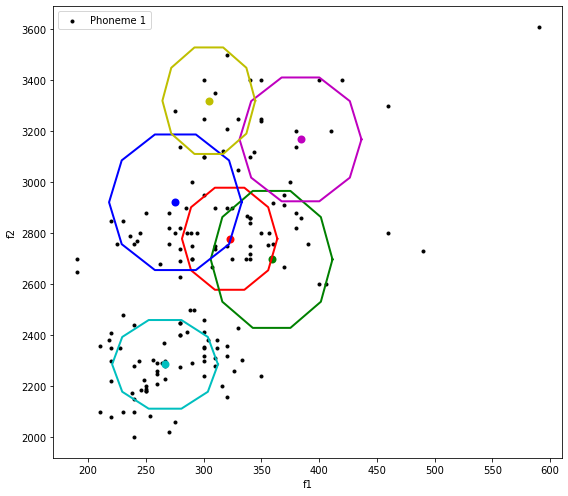

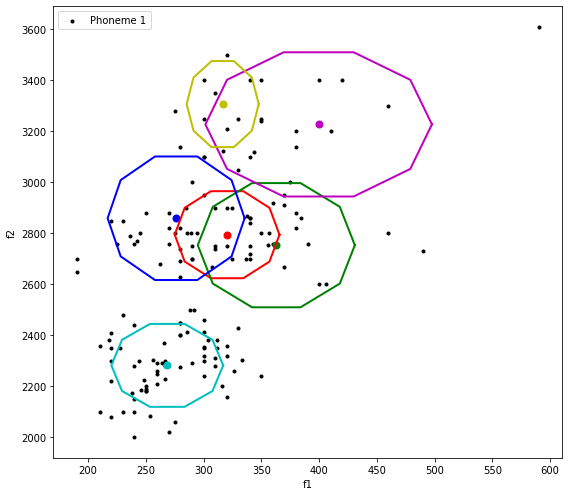

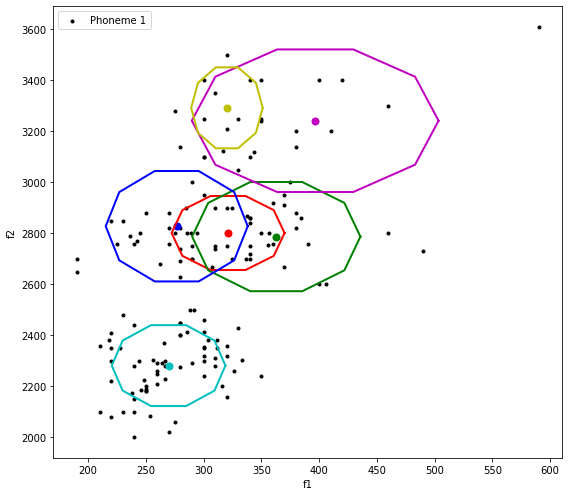

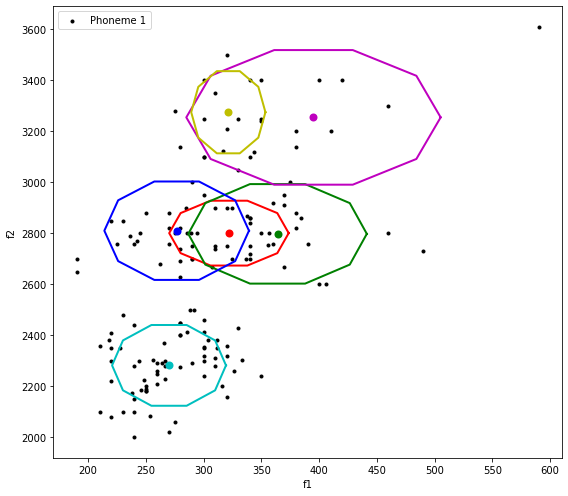

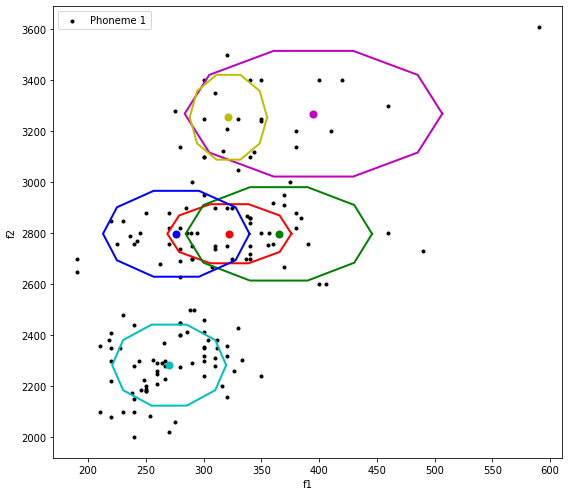

...

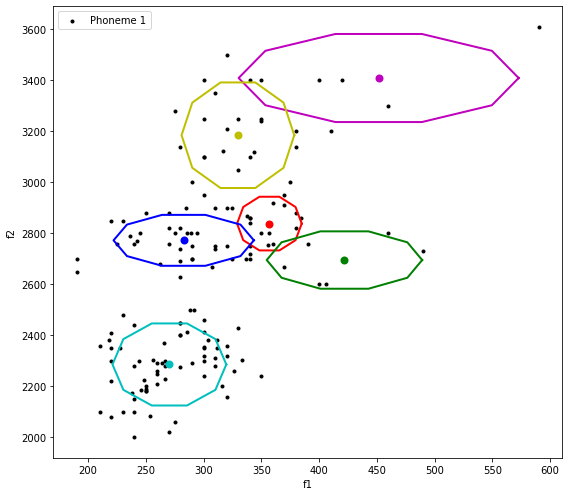

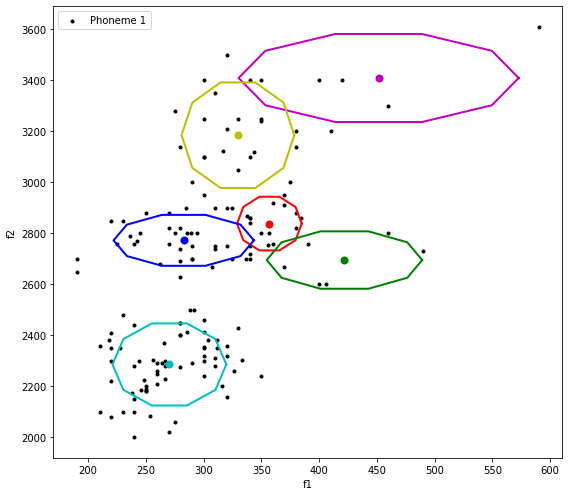

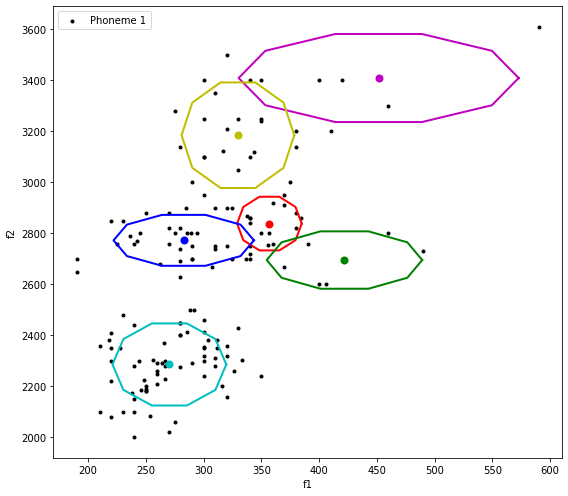

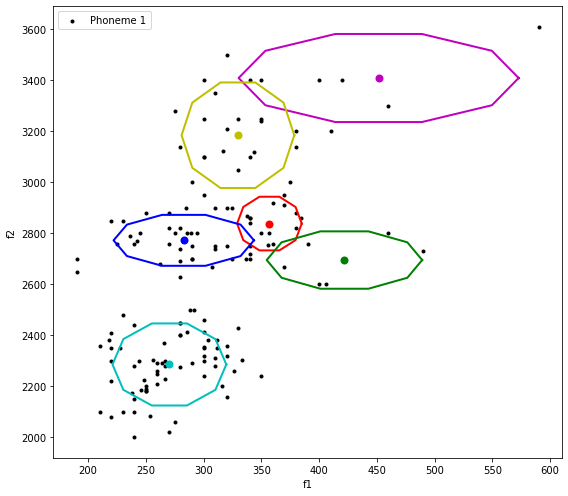

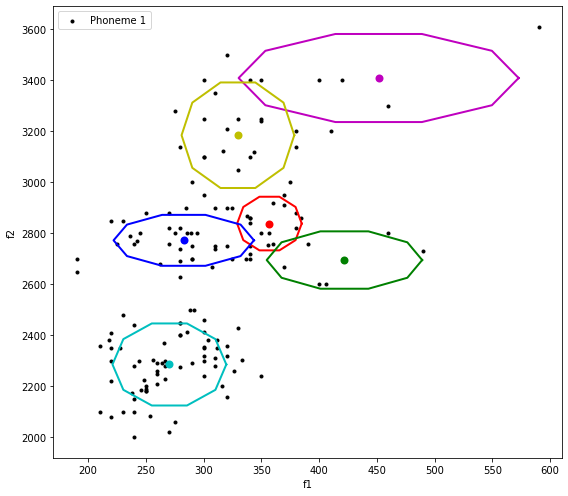

In [25]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)
        
        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print('\nMeans of GMM components.\n')
print(mu)
print('\n')
print('\nCovariances of GMM components.\n')
print(s)
save_model(mu, s, p)

In [86]:
k = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 2
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

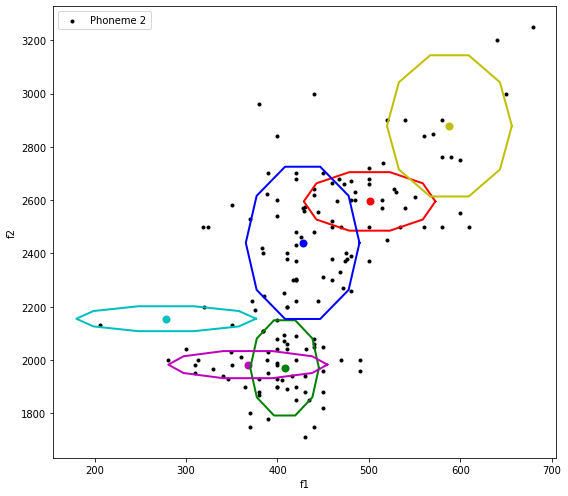


Finished.


Means of GMM components.

[[ 500.81476 2595.142  ]
 [ 407.80194 1970.464  ]
 [ 427.53766 2439.672  ]
 [ 278.2157  2154.9233 ]
 [ 367.57938 1982.6123 ]
 [ 588.1512  2878.5999 ]]



Covariances of GMM components.

[[[ 2591.71433868     0.        ]
  [    0.          6664.36152371]]

 [[  705.3611237      0.        ]
  [    0.         17656.5330991 ]]

 [[ 1933.72317955     0.        ]
  [    0.         45116.90650275]]

 [[ 4833.79856306     0.        ]
  [    0.          1208.45148433]]

 [[ 3783.96935127     0.        ]
  [    0.          1428.19859641]]

 [[ 2332.96274472     0.        ]
  [    0.         38794.18287969]]]


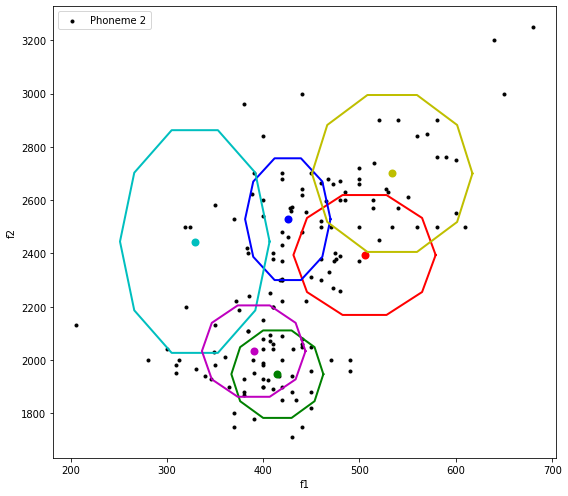

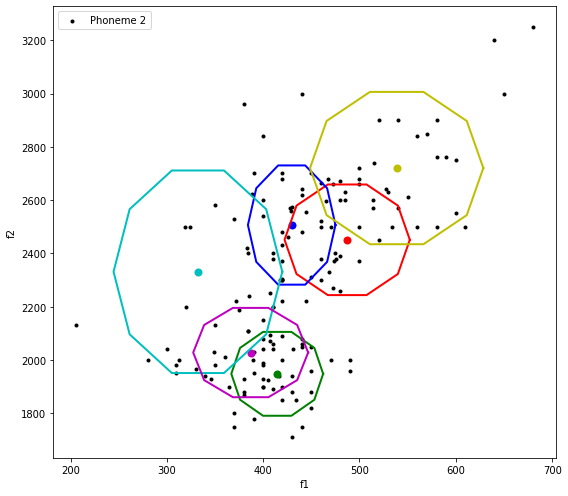

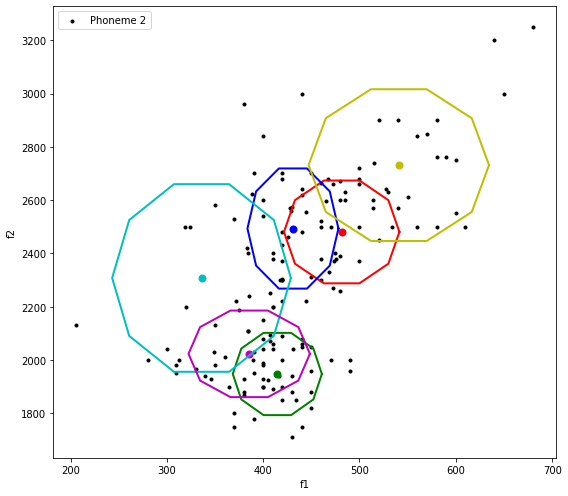

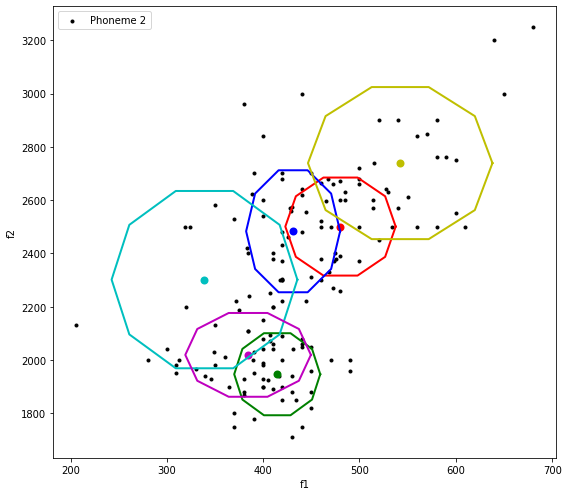

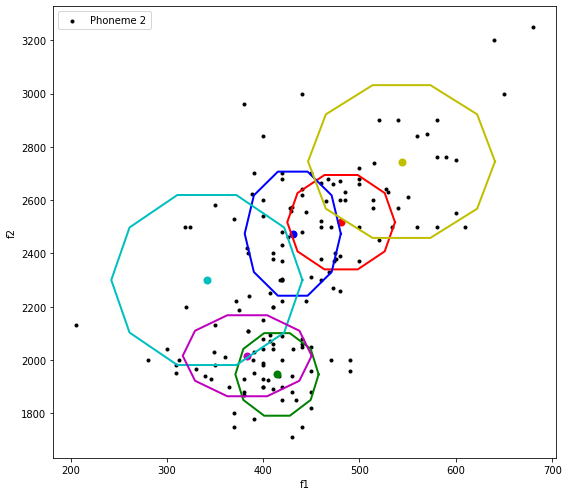

...

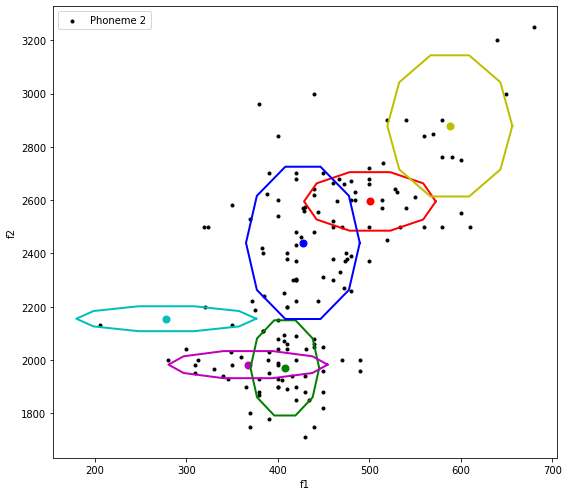

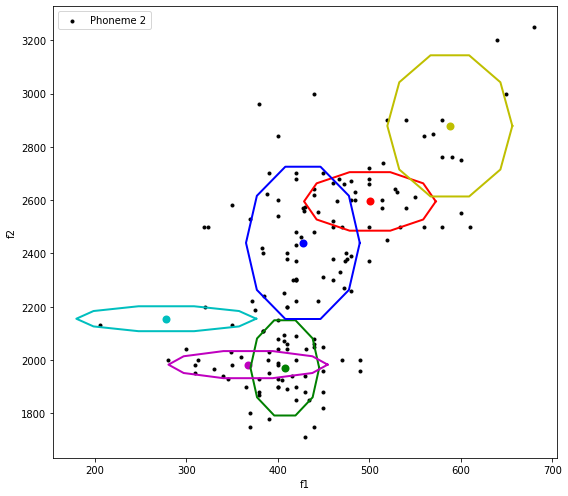

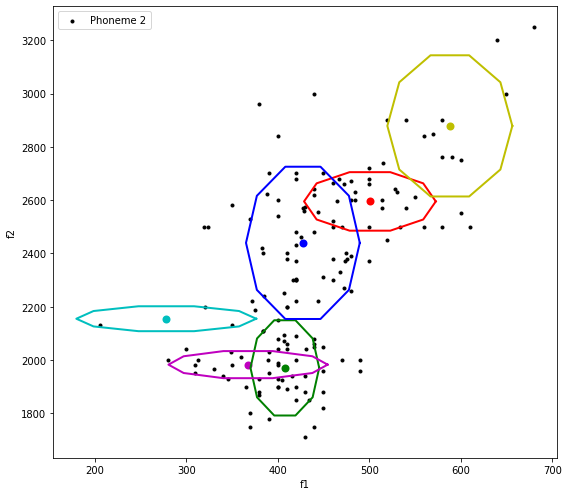

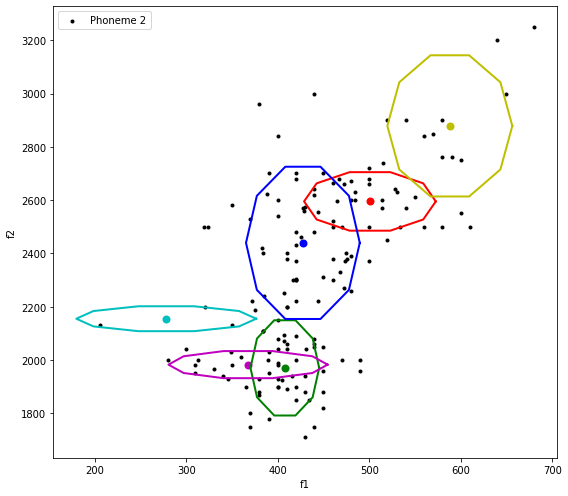

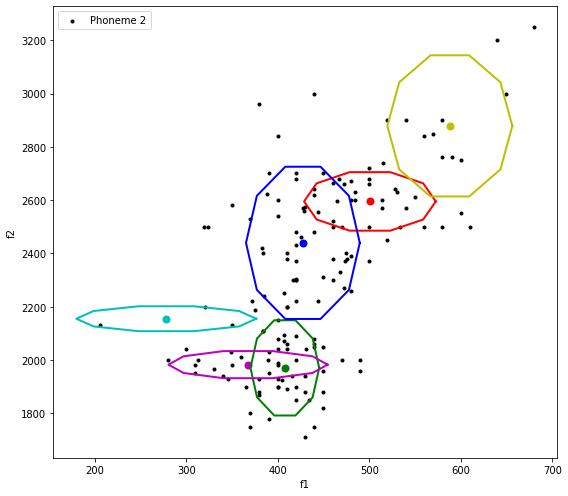

In [87]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)
        
        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print('\nMeans of GMM components.\n')
print(mu)
print('\n')
print('\nCovariances of GMM components.\n')
print(s)
save_model(mu, s, p)

In [29]:


k = 3
inds_1 = np.where(phoneme_id==1)
inds_2 = np.where(phoneme_id==2)
inds_1 = inds_1[0]
inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]
phoneme_pred = []

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk
 
# get predictions
Z_phoneme_1 = get_predictions( mu, s, p, X)
Z_phoneme_1 = Z_phoneme_1.astype(np.float32)
Z_phoneme_1_sum = np.sum(Z_phoneme_1,axis=1)

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_2['mu']
s = GMM_parameters_phoneme_2['s']
p = GMM_parameters_phoneme_2['p']

Z_phoneme_2 = np.zeros((N,k))

Z_phoneme_2 = get_predictions( mu, s, p, X)
Z_phoneme_2 = Z_phoneme_2.astype(np.float32)
Z_phoneme_2_sum = np.sum(Z_phoneme_2,axis=1)

# classify each point using Maximum Likelihood

for z1, z2 in zip(Z_phoneme_1_sum,Z_phoneme_2_sum):
  if z1 > z2:
      phoneme_pred.append(0.0)
  else:
      phoneme_pred.append(1.0)

final_phoneme_pred = np.array(phoneme_pred)
# calculate accuracy

phoneme_true = np.concatenate((np.zeros((np.sum(phoneme_id==1))),np.ones((np.sum(phoneme_id==2)))),axis =0)

count_accuracy = []
for yt, yp in zip(phoneme_true,final_phoneme_pred):
  if yt == yp:
    count_accuracy.append(1)
  else:
    count_accuracy.append(0)

accuracy_score = sum(count_accuracy)/len(count_accuracy)
accuracy_score_str = str(accuracy_score*100)
print("The accuracy is " + accuracy_score_str + ' %')

miss_classification = []
for yt, yp in zip(phoneme_true,final_phoneme_pred):
  if yt != yp:
    miss_classification.append(1)
  else:
    miss_classification.append(0)

miss_classification_score = sum(miss_classification)/len(miss_classification)
mcs_str = str(miss_classification_score*100)
print("The miss classification error is " + mcs_str + ' %')
  



The accuracy is 95.06578947368422 %
The miss classification error is 4.934210526315789 %


In [30]:


k = 6
inds_1 = np.where(phoneme_id==1)
inds_2 = np.where(phoneme_id==2)
inds_1 = inds_1[0]
inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]
phoneme_pred = []

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk
 
# get predictions
Z_phoneme_1 = get_predictions( mu, s, p, X)
Z_phoneme_1 = Z_phoneme_1.astype(np.float32)
Z_phoneme_1_sum = np.sum(Z_phoneme_1,axis=1)

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_2['mu']
s = GMM_parameters_phoneme_2['s']
p = GMM_parameters_phoneme_2['p']

Z_phoneme_2 = np.zeros((N,k))

Z_phoneme_2 = get_predictions( mu, s, p, X)
Z_phoneme_2 = Z_phoneme_2.astype(np.float32)
Z_phoneme_2_sum = np.sum(Z_phoneme_2,axis=1)

# classify each point using Maximum Likelihood

### your code here
for z1, z2 in zip(Z_phoneme_1_sum,Z_phoneme_2_sum):
  if z1 > z2:
      phoneme_pred.append(0.0)
  else:
      phoneme_pred.append(1.0)

final_phoneme_pred = np.array(phoneme_pred)
# calculate accuracy

phoneme_true = np.concatenate((np.zeros((np.sum(phoneme_id==1))),np.ones((np.sum(phoneme_id==2)))),axis =0)

count_accuracy = []
for yt, yp in zip(phoneme_true,final_phoneme_pred):
  if yt == yp:
    count_accuracy.append(1)
  else:
    count_accuracy.append(0)

accuracy_score = sum(count_accuracy)/len(count_accuracy)
accuracy_score_str = str(accuracy_score*100)
print("The accuracy is " + accuracy_score_str + ' %')

miss_classification = []
for yt, yp in zip(phoneme_true,final_phoneme_pred):
  if yt != yp:
    miss_classification.append(1)
  else:
    miss_classification.append(0)

miss_classification_score = sum(miss_classification)/len(miss_classification)
mcs_str = str(miss_classification_score*100)
print("The miss classification error is " + mcs_str + ' %')




The accuracy is 96.05263157894737 %
The miss classification error is 3.9473684210526314 %


In [90]:
print(Z_phoneme_1_sum.shape)
print(Z_phoneme_1_sum)

(304,)
[1.13501410e-05 1.01384403e-05 5.02505145e-06 3.05220578e-06
 9.48430989e-06 1.23878644e-05 1.07718688e-05 6.23416463e-06
 8.53396432e-06 1.52083439e-05 7.05219600e-06 1.86093541e-06
 5.79029029e-06 8.70244457e-06 2.27365899e-06 3.93397522e-06
 5.46265892e-06 1.59388073e-05 1.55375474e-05 1.08400563e-05
 1.18905300e-05 7.03590194e-06 3.40509541e-06 4.94709775e-06
 1.41790779e-05 1.58886851e-05 6.86318845e-06 5.05560411e-06
 2.54784914e-06 6.57757425e-07 9.79548258e-06 4.01199077e-06
 1.63341210e-05 1.50651913e-05 1.11090367e-06 1.33392132e-06
 3.20396566e-07 7.52312815e-07 9.48430989e-06 1.30182652e-05
 1.01384403e-05 1.11183890e-05 1.15027096e-05 1.13676333e-06
 3.41011537e-06 5.97579174e-06 6.23416463e-06 2.95855693e-06
 1.01750129e-05 3.64786479e-06 9.13295025e-06 1.65250731e-05
 2.78409470e-06 1.41397220e-06 3.47622085e-06 1.48470708e-05
 3.26595455e-06 4.54653627e-06 1.64253906e-05 5.79981270e-06
 5.97245571e-06 1.00267380e-05 2.77474942e-06 1.28646388e-05
 8.38493725e-06 6

f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points


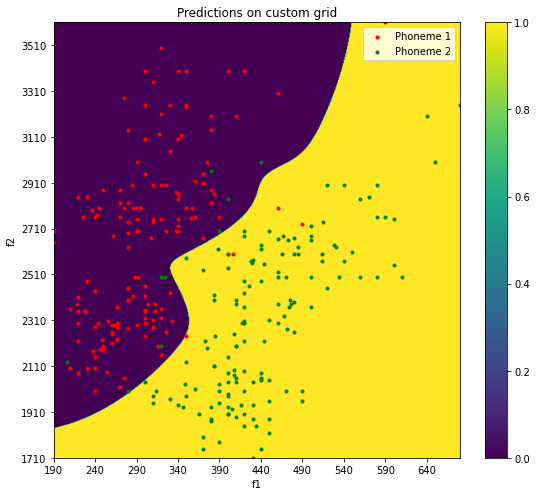

In [94]:
k = 3

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1 = int(np.min(X[:,0]))
max_f1 = int(np.max(X[:,0]))
min_f2 = int(np.min(X[:,1]))
max_f2 = int(np.max(X[:,1]))
N_f1 = max_f1 - min_f1
N_f2 = max_f2 - min_f2
print('f1 range: {}-{} | {} points'.format(min_f1, max_f1, N_f1))
print('f2 range: {}-{} | {} points'.format(min_f2, max_f2, N_f2))

#########################################

# Create a custom grid of shape N_f1 x N_f2
custom_grid = np.zeros((N_f1,N_f2,2))

# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
for i in range(N_f1):
 for j in range(N_f2):
  custom_grid[i][j] = [int(i + min_f1),(j + min_f2)]

def cal_pred(k,grid_val):

  # Do predictions, using GMM trained on phoneme 1, on custom grid
  # Do predictions, using GMM trained on phoneme 2, on custom grid
    p_1_path = 'data/GMM_params_phoneme_01_k_03.npy'
    phoneme_1_data = np.load(p_1_path, allow_pickle=True)
    phoneme_1_data = np.ndarray.tolist(phoneme_1_data)

    p_2_path = 'data/GMM_params_phoneme_02_k_03.npy'
    phoneme_2_data = np.load(p_2_path, allow_pickle=True)
    phoneme_2_data = np.ndarray.tolist(phoneme_2_data)

    z1 = get_predictions(phoneme_1_data['mu'],phoneme_1_data['s'], phoneme_1_data['p'], grid_val)
    z1_sum = np.sum(z1,axis=1)
    z2 = get_predictions(phoneme_2_data['mu'],phoneme_2_data['s'], phoneme_2_data['p'], grid_val)
    z2_sum = np.sum(z2,axis=1)

    predClass = []

    for x1,x2 in zip(z1_sum,z2_sum):
      if x1 > x2:
        predClass.append(0.0)
      else:
        predClass.append(1.0)

    pred_y = np.array(predClass)
    return pred_y
# Compare these predictions, to classify each point of the grid
# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
M = np.ndarray(shape=(N_f2, N_f1))
for i in range(0,N_f2):
 M[i,:] = cal_pred(3, custom_grid[:,i])

# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
########################################/

################################################
# Visualize predictions on custom grid

# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points


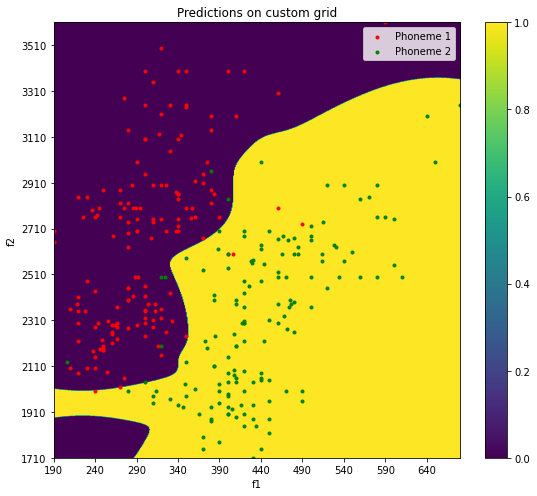

In [98]:
k = 6

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1 = int(np.min(X[:,0]))
max_f1 = int(np.max(X[:,0]))
min_f2 = int(np.min(X[:,1]))
max_f2 = int(np.max(X[:,1]))
N_f1 = max_f1 - min_f1
N_f2 = max_f2 - min_f2
print('f1 range: {}-{} | {} points'.format(min_f1, max_f1, N_f1))
print('f2 range: {}-{} | {} points'.format(min_f2, max_f2, N_f2))

#########################################

# Create a custom grid of shape N_f1 x N_f2
custom_grid = np.zeros((N_f1,N_f2,2))

# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
for i in range(N_f1):
 for j in range(N_f2):
  custom_grid[i][j] = [int(i + min_f1),(j + min_f2)]

def cal_pred(k,grid_val):

  # Do predictions, using GMM trained on phoneme 1, on custom grid
  # Do predictions, using GMM trained on phoneme 2, on custom grid
    p_1_path = 'data/GMM_params_phoneme_01_k_06.npy'
    phoneme_1_data = np.load(p_1_path, allow_pickle=True)
    phoneme_1_data = np.ndarray.tolist(phoneme_1_data)

    p_2_path = 'data/GMM_params_phoneme_02_k_06.npy'
    phoneme_2_data = np.load(p_2_path, allow_pickle=True)
    phoneme_2_data = np.ndarray.tolist(phoneme_2_data)

    z1 = get_predictions(phoneme_1_data['mu'],phoneme_1_data['s'], phoneme_1_data['p'], grid_val)
    z1_sum = np.sum(z1,axis=1)
    z2 = get_predictions(phoneme_2_data['mu'],phoneme_2_data['s'], phoneme_2_data['p'], grid_val)
    z2_sum = np.sum(z2,axis=1)

    predClass = []

    for x1,x2 in zip(z1_sum,z2_sum):
      if x1 > x2:
        predClass.append(0.0)
      else:
        predClass.append(1.0)

    pred_y = np.array(predClass)
    return pred_y
# Compare these predictions, to classify each point of the grid
# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
M = np.ndarray(shape=(N_f2, N_f1))
for i in range(0,N_f2):
 M[i,:] = cal_pred(3, custom_grid[:,i])

# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
########################################/

################################################
# Visualize predictions on custom grid

# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

Iteration 001/150



Means of GMM components (mu): 

[[ 290. 2700. 2990.]
 [ 290. 2290. 2580.]
 [ 300. 2950. 3250.]]



Covariances of GMM components (s): 

[[[ 1192.96131056  4037.40792378  5230.36923434]
  [ 4037.40792378 46966.42122691 51003.82915069]
  [ 5230.36923434 51003.82915069 56234.19838504]]

 [[ 1192.96131056  4037.40792378  5230.36923434]
  [ 4037.40792378 46966.42122691 51003.82915069]
  [ 5230.36923434 51003.82915069 56234.19838504]]

 [[ 1192.96131056  4037.40792378  5230.36923434]
  [ 4037.40792378 46966.42122691 51003.82915069]
  [ 5230.36923434 51003.82915069 56234.19838504]]]



Weights of GMM components (p): 

[0.33333333 0.33333333 0.33333333]
Iteration 002/150



Means of GMM components (mu): 

[[ 294.87866 2681.6821  2976.5608 ]
 [ 294.87173 2338.7102  2633.5818 ]
 [ 309.76978 3003.2988  3313.0686 ]]



Covariances of GMM components (s): 

[[[ 2847.23532279  9126.62041406 11973.85573685]
  [ 9126.62041406 68733.69304064 77860.3134547 ]
  [11973.85573685 77860.3

<ipython-input-9-5c11a34e070c>:26: RuntimeWarning: divide by zero encountered in double_scalars
  Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))


ValueError: ignored

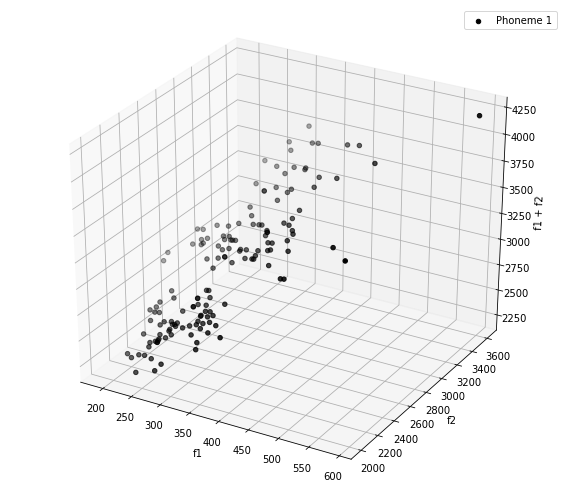

In [51]:
p_id = 1
# id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################

X[:,0] = f1
X[:,1] = f2
X[:,2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id==p_id,:]
#X = X[phoneme_id==p_id]
#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X_phoneme, title_string=title_string, ax=ax1)

N, D = X_phoneme.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X_phoneme[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X_phoneme.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))
    print('\n')
    print('\nMeans of GMM components (mu): \n')
    print(mu)
    print('\n')
    print('\nCovariances of GMM components (s): \n')
    print(s)
    print('\n')
    print('\nWeights of GMM components (p): \n')
    print(p)

    # Do the E-step
    Z = get_predictions(mu, s, p, X_phoneme)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X_phoneme.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        term_1 = X_phoneme.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X_phoneme, 'Phoneme {}'.format(p_id))
plt.show()

Method 1

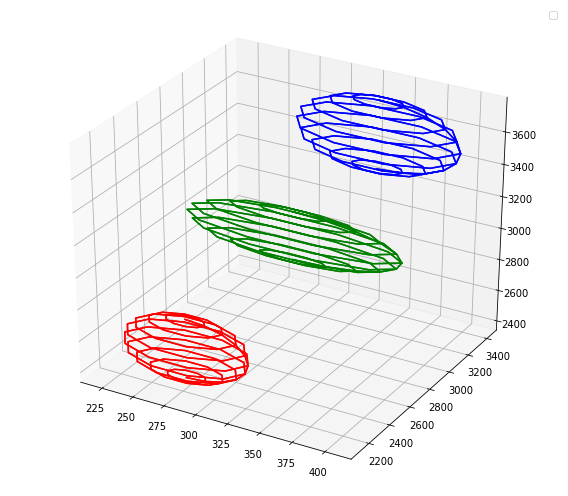

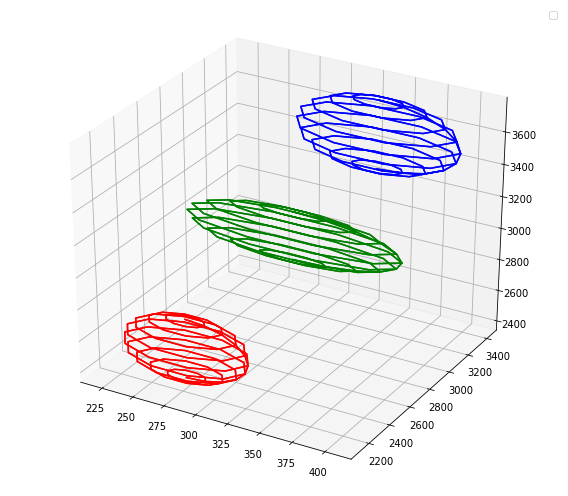

In [45]:
#########################################
p_id = 1
# id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################

X[:,0] = f1
X[:,1] = f2
X[:,2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id==p_id,:]
#X = X[phoneme_id==p_id]
#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X_phoneme, title_string=title_string, ax=ax1)

N, D = X_phoneme.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X_phoneme[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X_phoneme.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))
    print('\n')
    print('\nMeans of GMM components (mu): \n')
    print(mu)
    print('\n')
    print('\nCovariances of GMM components (s): \n')
    print(s)
    print('\n')
    print('\nWeights of GMM components (p): \n')
    print(p)

    # Do the E-step
    Z = get_predictions(mu, s, p, X_phoneme)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X_phoneme.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X_phoneme.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)
        #term_1 = X_phoneme.transpose() - mu_i_repeated
        #term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        #s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X_phoneme, 'Phoneme {}'.format(p_id))
plt.show()


Method 2

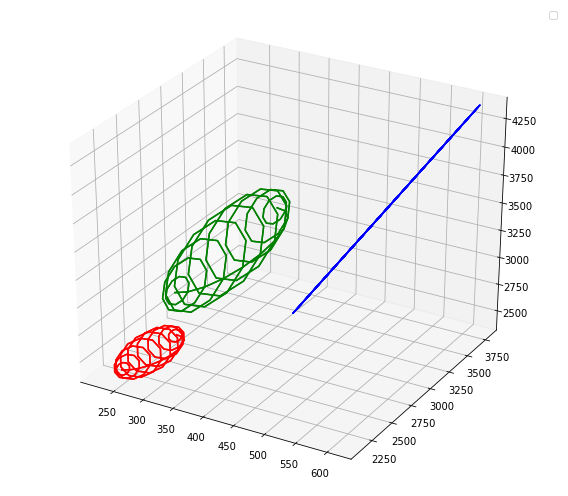

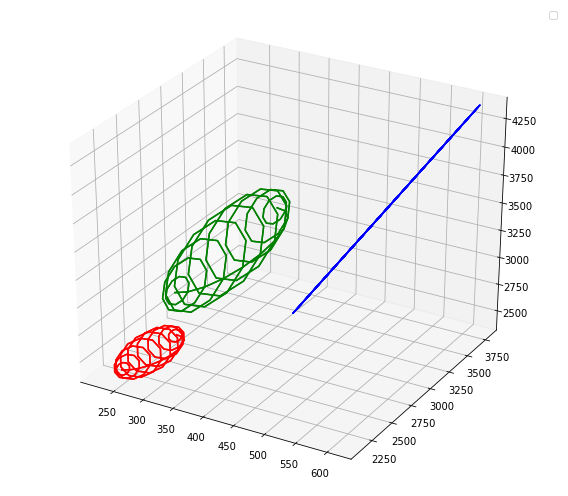

In [52]:
#########################################
p_id = 1
# id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################

X[:,0] = f1
X[:,1] = f2
X[:,2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id==p_id,:]
#X = X[phoneme_id==p_id]
#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X_phoneme, title_string=title_string, ax=ax1)

N, D = X_phoneme.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X_phoneme[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X_phoneme.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))
    print('\n')
    print('\nMeans of GMM components (mu): \n')
    print(mu)
    print('\n')
    print('\nCovariances of GMM components (s): \n')
    print(s)
    print('\n')
    print('\nWeights of GMM components (p): \n')
    print(p)

    # Do the E-step
    Z = get_predictions(mu, s, p, X_phoneme)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X_phoneme.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        term_1 = X_phoneme.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:, i], axis=1), D, axis=1) * term_1.transpose()
        s[i, :, :] = np.matmul(term_1, term_2) / np.sum(Z[:, i])
        s[i, :, :] += 0.001 * np.identity(D)
        p[i] = np.mean(Z[:, i])
    ax1.clear()

plot_gaussians(ax1, 2*s, mu, X_phoneme, 'Phoneme {}'.format(p_id))
plt.show()


Method 1

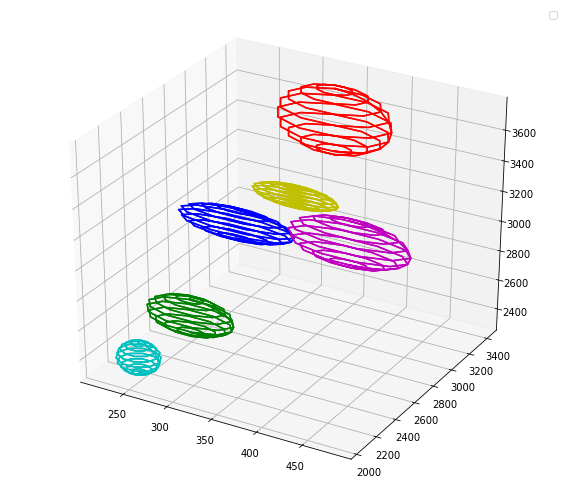

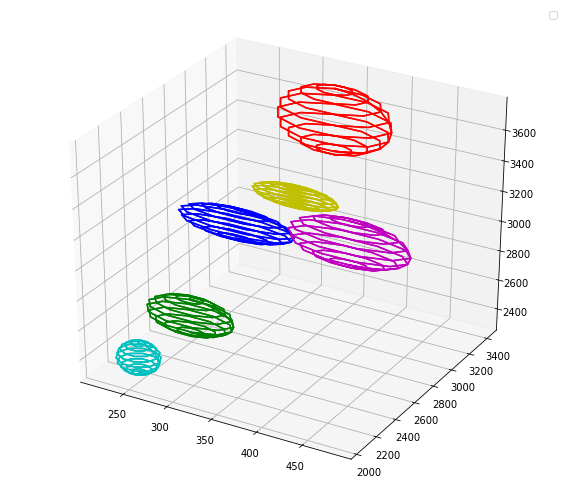

In [53]:
#########################################
p_id = 1
# id of the phoneme that will be used (e.g. 1, or 2)

k = 6 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################

X[:,0] = f1
X[:,1] = f2
X[:,2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id==p_id,:]
#X = X[phoneme_id==p_id]
#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X_phoneme, title_string=title_string, ax=ax1)

N, D = X_phoneme.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X_phoneme[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X_phoneme.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))
    print('\n')
    print('\nMeans of GMM components (mu): \n')
    print(mu)
    print('\n')
    print('\nCovariances of GMM components (s): \n')
    print(s)
    print('\n')
    print('\nWeights of GMM components (p): \n')
    print(p)

    # Do the E-step
    Z = get_predictions(mu, s, p, X_phoneme)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X_phoneme.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X_phoneme.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)
        #term_1 = X_phoneme.transpose() - mu_i_repeated
        #term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        #s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X_phoneme, 'Phoneme {}'.format(p_id))
plt.show()


Method 2

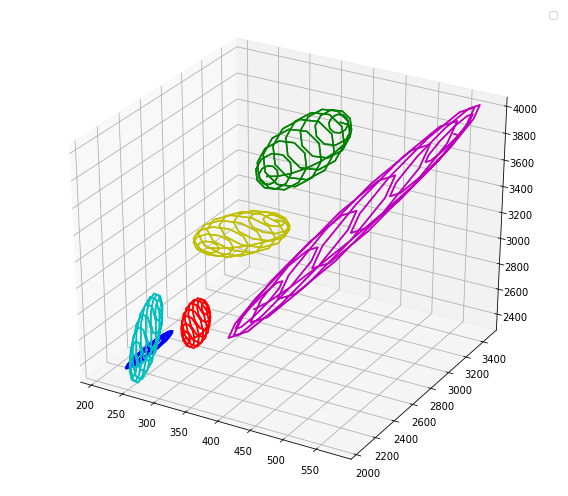

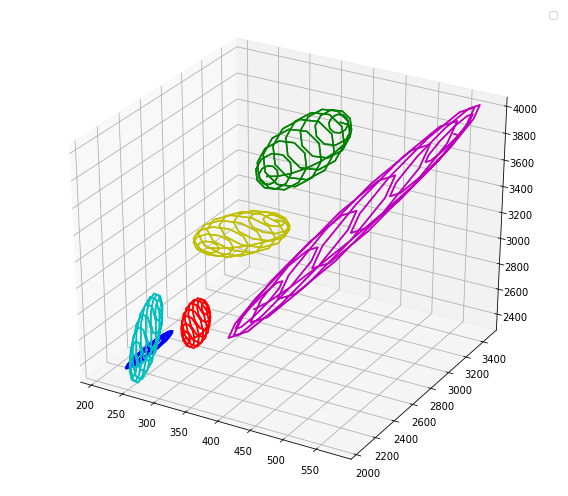

In [92]:
#########################################
p_id = 1
# id of the phoneme that will be used (e.g. 1, or 2)

k = 6 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################

X[:,0] = f1
X[:,1] = f2
X[:,2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id==p_id,:]
#X = X[phoneme_id==p_id]
#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X_phoneme, title_string=title_string, ax=ax1)

N, D = X_phoneme.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X_phoneme[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X_phoneme.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))
    print('\n')
    print('\nMeans of GMM components (mu): \n')
    print(mu)
    print('\n')
    print('\nCovariances of GMM components (s): \n')
    print(s)
    print('\n')
    print('\nWeights of GMM components (p): \n')
    print(p)

    # Do the E-step
    Z = get_predictions(mu, s, p, X_phoneme)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X_phoneme.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        term_1 = X_phoneme.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:, i], axis=1), D, axis=1) * term_1.transpose()
        s[i, :, :] = np.matmul(term_1, term_2) / np.sum(Z[:, i])
        s[i, :, :] += 0.001 * np.identity(D)
        p[i] = np.mean(Z[:, i])
    ax1.clear()

plot_gaussians(ax1, 2*s, mu, X_phoneme, 'Phoneme {}'.format(p_id))
plt.show()


Method 1

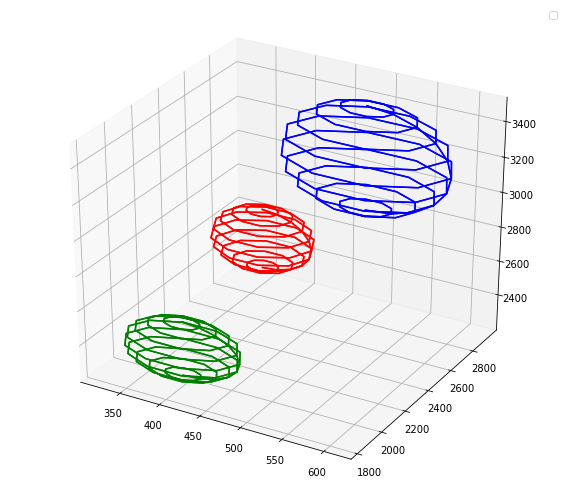

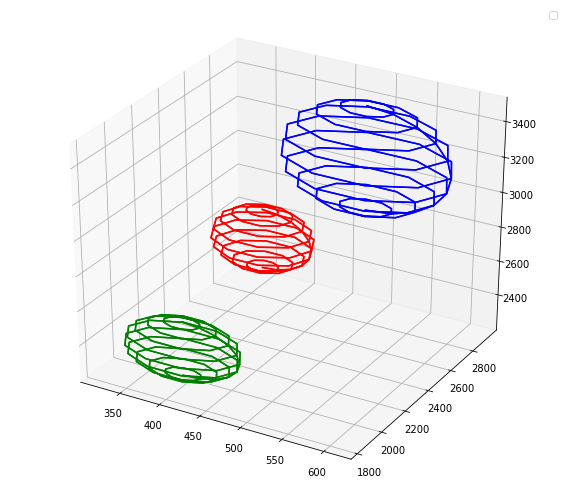

In [55]:
#########################################
p_id = 2
# id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################

X[:,0] = f1
X[:,1] = f2
X[:,2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id==p_id,:]
#X = X[phoneme_id==p_id]
#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X_phoneme, title_string=title_string, ax=ax1)

N, D = X_phoneme.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X_phoneme[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X_phoneme.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('\n')
    print('\nMeans of GMM components (mu): \n')
    print(mu)
    print('\n')
    print('\nCovariances of GMM components (s): \n')
    print(s)
    print('\n')
    print('\nWeights of GMM components (p): \n')
    print(p)

    # Do the E-step
    Z = get_predictions(mu, s, p, X_phoneme)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X_phoneme.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X_phoneme.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)
        #term_1 = X_phoneme.transpose() - mu_i_repeated
        #term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        #s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X_phoneme, 'Phoneme {}'.format(p_id))
plt.show()


Method 2

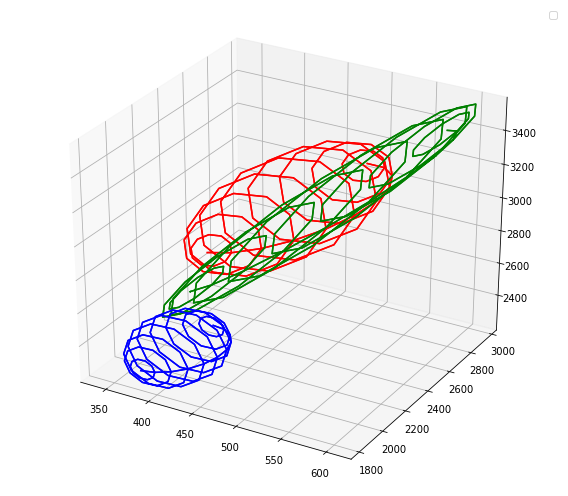

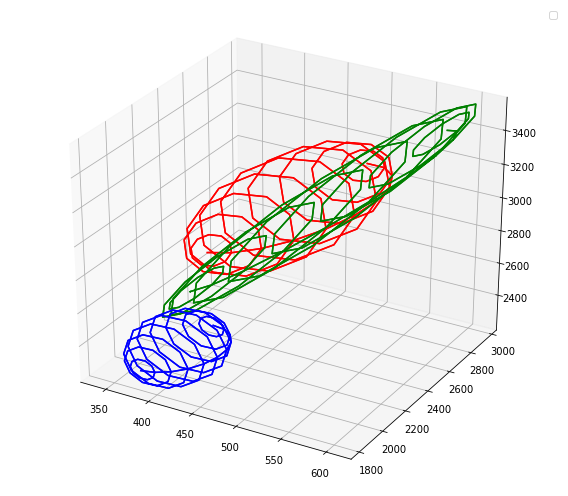

In [56]:
#########################################
p_id = 2
# id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################

X[:,0] = f1
X[:,1] = f2
X[:,2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id==p_id,:]
#X = X[phoneme_id==p_id]
#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X_phoneme, title_string=title_string, ax=ax1)

N, D = X_phoneme.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X_phoneme[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X_phoneme.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))
    print('\n')
    print('\nMeans of GMM components (mu): \n')
    print(mu)
    print('\n')
    print('\nCovariances of GMM components (s): \n')
    print(s)
    print('\n')
    print('\nWeights of GMM components (p): \n')
    print(p)

    # Do the E-step
    Z = get_predictions(mu, s, p, X_phoneme)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X_phoneme.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        term_1 = X_phoneme.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:, i], axis=1), D, axis=1) * term_1.transpose()
        s[i, :, :] = np.matmul(term_1, term_2) / np.sum(Z[:, i])
        s[i, :, :] += 0.001 * np.identity(D)
        p[i] = np.mean(Z[:, i])
    ax1.clear()

plot_gaussians(ax1, 2*s, mu, X_phoneme, 'Phoneme {}'.format(p_id))
plt.show()


Method 1

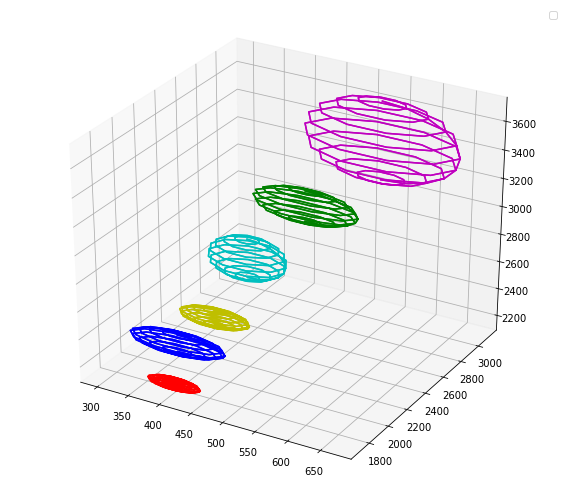

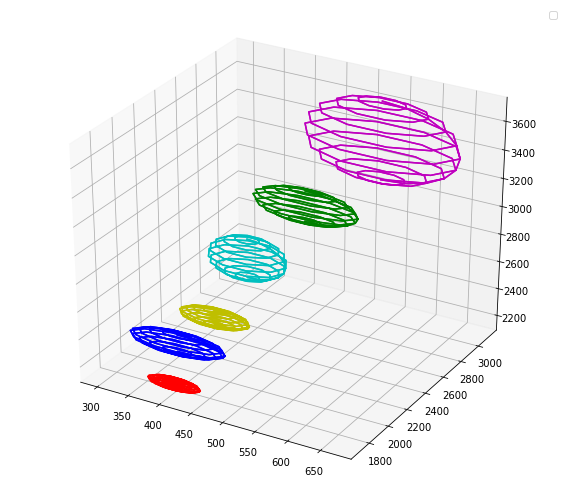

In [57]:
#########################################
p_id = 2
# id of the phoneme that will be used (e.g. 1, or 2)

k = 6 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################

X[:,0] = f1
X[:,1] = f2
X[:,2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id==p_id,:]
#X = X[phoneme_id==p_id]
#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X_phoneme, title_string=title_string, ax=ax1)

N, D = X_phoneme.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X_phoneme[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X_phoneme.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))
    print('\n')
    print('\nMeans of GMM components (mu): \n')
    print(mu)
    print('\n')
    print('\nCovariances of GMM components (s): \n')
    print(s)
    print('\n')
    print('\nWeights of GMM components (p): \n')
    print(p)
    # Do the E-step
    Z = get_predictions(mu, s, p, X_phoneme)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X_phoneme.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X_phoneme.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)
        #term_1 = X_phoneme.transpose() - mu_i_repeated
        #term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        #s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X_phoneme, 'Phoneme {}'.format(p_id))
plt.show()


Method 2

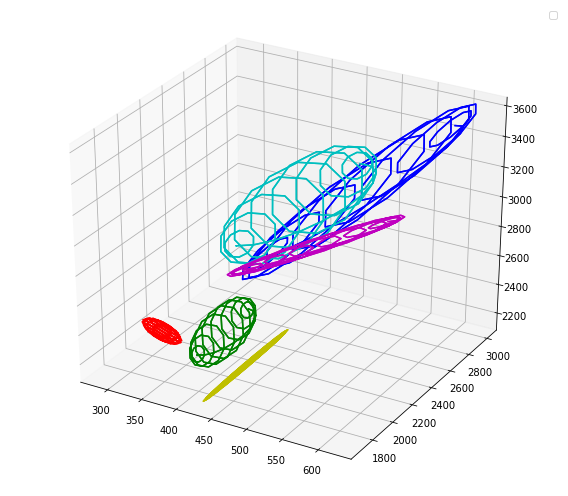

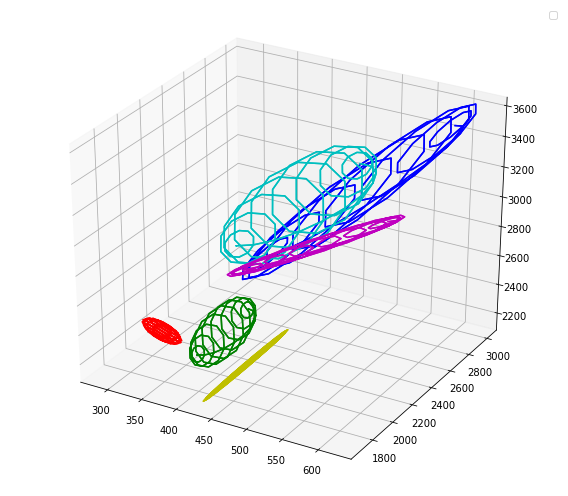

In [59]:
#########################################
p_id = 2
# id of the phoneme that will be used (e.g. 1, or 2)

k = 6 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################

X[:,0] = f1
X[:,1] = f2
X[:,2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id==p_id,:]
#X = X[phoneme_id==p_id]
#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X_phoneme, title_string=title_string, ax=ax1)

N, D = X_phoneme.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X_phoneme[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X_phoneme.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))
    print('\n')
    print('\nMeans of GMM components (mu): \n')
    print(mu)
    print('\n')
    print('\nCovariances of GMM components (s): \n')
    print(s)
    print('\n')
    print('\nWeights of GMM components (p): \n')
    print(p)

    # Do the E-step
    Z = get_predictions(mu, s, p, X_phoneme)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X_phoneme.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        term_1 = X_phoneme.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:, i], axis=1), D, axis=1) * term_1.transpose()
        s[i, :, :] = np.matmul(term_1, term_2) / np.sum(Z[:, i])
        s[i, :, :] += 0.001 * np.identity(D)
        p[i] = np.mean(Z[:, i])
    ax1.clear()

plot_gaussians(ax1, 2*s, mu, X_phoneme, 'Phoneme {}'.format(p_id))
plt.show()
